# take all the appa's data(11y), find the season polyline and normalize the data

In [1]:
import math
import locale
import numpy as np
import pandas as pd
import plotly
import plotly.express as px
from tqdm import tqdm
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.colors import to_rgb, rgb_to_hsv, hsv_to_rgb
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import train_test_split
from scipy.stats import linregress
import datetime as dt
from sklearn import svm
from sklearn import datasets
from sklearn.linear_model import LinearRegression
from joblib import dump, load

STATION = "Parco S. Chiara"
pollu = ["Biossido di Azoto", "Ossido di Carbonio", "PM10", "Ozono", "PM2.5", "Biossido Zolfo"]
POLLUTANT = pollu[0]

In [2]:
ds = pd.read_csv('data/APPA_data_merged.csv')
ds.Data = pd.to_datetime(ds.Data, format = "%Y-%m-%d %H:%M:%S")
ds.Valore = ds.Valore.map(lambda x: int(x))

In [3]:
ds.value_counts(ds.Inquinante == POLLUTANT)

Inquinante
False    1637786
True      640972
dtype: int64

In [4]:
ds = ds[ds.Inquinante == POLLUTANT]
ds = ds[ ds.Stazione == STATION]

In [5]:
fig_all= px.scatter(y="Valore",x="Data",data_frame=ds[ds.Data.dt.date == ds.iloc[500].Data.date()])
fig_all.show()

In [6]:
ds_day = ds.set_index("Data")
ds_day = ds_day.resample("d").sum()
ds_day = ds_day.reset_index(level=0)

In [7]:
ds = ds.set_index("Data").resample("H").mean().reset_index(level=0)

In [8]:
ds.insert(2,"day_of_year",ds.Data.map(lambda x: x.dayofyear),True)
ds_day.insert(2,"day_of_year",ds_day.Data.map(lambda x: x.dayofyear),True)

In [9]:
fig_all= px.scatter(y="Valore",x="Data",data_frame=ds_day)
fig_all.show()

In [10]:
fig_all= px.scatter(y="Valore",x="day_of_year",data_frame=ds_day)
fig_all.show()

In [11]:
plt.xkcd(scale=0.5)

p = sns.color_palette("colorblind")

TRUE_COLOR = p[1]
SAMPLES_COLOR = p[0]  #"steelblue"
POLY_3_COLOR = p[2]  #"darkorange"
POLY_15_COLOR = p[3]  #"darkgreen"
TRAIN_COLOR = p[4]  #"crimson"
TEST_COLOR = p[5]  #"darkolivegreen"


def true_fun(x):
    return np.cos(1.5 * np.pi * x)

def poly_fit(X, y, degree):
    pipeline = make_pipeline(
        PolynomialFeatures(degree=degree, include_bias=False),
        LinearRegression(),
    )
    pipeline.fit(X, y)
    return pipeline

def start_plot():
    fig, ax = plt.subplots(constrained_layout=True)
    return fig, ax

def finalise_plot(ax):
    ax.set_xticks(())
    ax.set_yticks(())
    ax.set_xlabel("x")
    ax.set_ylabel("y")
    ax.set_xlim((-60, 400))
    ax.set_ylim((-2, 2500))
    ax.legend(loc="best")

def plot_model(ax, model, color, label="Model"):
    X_test = np.linspace(-60, 400, 50000)[:, np.newaxis]
    y_pred = model.predict(X_test)
    ax.plot(X_test, y_pred, label=label, color=color, linestyle="--")

def plot_true(ax):
    X_test = np.linspace(0, 366, 10000)[:, np.newaxis]
    ax.plot(X_test, true_fun(X_test), label="True function", color=TRUE_COLOR)

def plot_samples(ax, X, y, label, color):
    edgecolor = hsv_to_rgb(rgb_to_hsv(to_rgb(color)) * [1.0, 0.9, 1.0])
    ax.scatter(X, y, edgecolor=edgecolor, facecolor=color, s=2, label=label, zorder=100)

In [12]:
ext_ds = ds_day
ext_ds = ds_day.append(ds_day[ds_day.day_of_year>300].assign(day_of_year=lambda x:x['day_of_year']-366))
ext_ds = ext_ds.append(ds_day[ds_day.day_of_year<60][ds_day.day_of_year>0].assign(day_of_year=lambda x:x['day_of_year']+366))

C:\Users\samue\AppData\Local\Temp\ipykernel_15128\2059438224.py:2: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

C:\Users\samue\AppData\Local\Temp\ipykernel_15128\2059438224.py:3: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.

C:\Users\samue\AppData\Local\Temp\ipykernel_15128\2059438224.py:3: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



In [13]:
fig_all= px.scatter(y="Valore",x="day_of_year",data_frame=ext_ds)
fig_all.show()

In [14]:
X_fit = ext_ds.day_of_year[:,np.newaxis]
y_fit = ext_ds.Valore

C:\Users\samue\AppData\Local\Temp\ipykernel_15128\2418346623.py:1: FutureWarning:

Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.



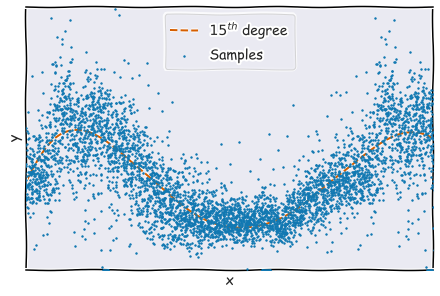

In [15]:
model = poly_fit(X_fit, y_fit, 5)

fig, ax = start_plot()
plot_model(ax, model, POLY_15_COLOR, "$15^{th}$ degree")

plot_samples(ax, X_fit, y_fit, "Samples", SAMPLES_COLOR)
finalise_plot(ax)

In [16]:
ds_norm = ds_day
ds_norm.insert(3,"norm_value",ds_norm.Valore - model.predict(ds_norm.day_of_year[:,np.newaxis]))

C:\Users\samue\AppData\Local\Temp\ipykernel_15128\2451845191.py:2: FutureWarning:

Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.



In [17]:
dump(model, f'models/{POLLUTANT}.joblib')

['models/Biossido di Azoto.joblib']

In [18]:
fig_all= px.scatter(y="norm_value",x="Data",data_frame=ds_norm, trendline="ols", trendline_color_override="white")
fig_all.show()
px.get_trendline_results(fig_all).px_fit_results.iloc[0].summary()


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                      y   R-squared:                       0.000
Model:                            OLS   Adj. R-squared:                  0.000
Method:                 Least Squares   F-statistic:                     1.188
Date:                Tue, 02 Aug 2022   Prob (F-statistic):              0.276
Time:                        09:17:54   Log-Likelihood:                -26894.
No. Observations:                3842   AIC:                         5.379e+04
Df Residuals:                    3840   BIC:                         5.381e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.1883      4.283      0.044      0.965      -8.208       8.585
x1            -3.7654      3.455     -1.090      0.276     -10.538       3.008
==============================================================================
Omnibus:                      835.548   Durbin-Watson:                   0.917
Prob(Omnibus):                  0.000   Jarque-Bera (JB):            10004.318
Skew:                           0.687   Prob(JB):                         0.00
Kurtosis:                      10.785   Cond. No.                         1.24
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [19]:
#ds_norm = ds_norm.set_index("Data").resample("H").ffill()


In [20]:
ds_norm = ds_norm.reset_index(level=0)
ds_norm

,index,Data,Valore,day_of_year,norm_value
0,0,2012-01-01,928,1,-394.200397
1,1,2012-01-02,1290,2,-31.203831
2,2,2012-01-03,989,3,-331.002972
3,3,2012-01-04,1070,4,-248.601508
4,4,2012-01-05,1102,5,-215.003101
...,...,...,...,...,...
3837,3837,2022-07-04,273,185,-122.114571
3838,3838,2022-07-05,300,186,-95.352767
3839,3839,2022-07-06,312,187,-83.692803
3840,3840,2022-07-07,358,188,-38.134537


to_drop = []
index_drop = []
for line in tqdm(ds_norm.iterrows(), total = ds.shape[0]):
    if ds[ds.Data == line[1].Data].empty:
        #print(line[0])
        #to_drop.append(line[1].Data)
        index_drop.append(line[0])


index_drop = [x for x in index_drop]

ds.drop(index_drop,axis=0,inplace=True)

In [21]:
ds_norm.insert(4,"relaxion_norm",ds_norm.norm_value / ds_norm.Valore)
# ds.insert(5,"norm_value",ds_norm[ds_norm.Data.dt.date == ds.Data.dt.date].relaxion_norm * ds.Valore)
ds.insert(3,"norm_value",np.NaN)

In [22]:

for i, line in tqdm(ds.iterrows(), total=ds.shape[0]):
    date_query = line.Data.date()
    coef = ds_norm[ds_norm.Data.dt.date == date_query].relaxion_norm
    ds.at[i,'norm_value'] = line.Valore * coef.values[0]

100%|██████████| 92184/92184 [04:58<00:00, 309.24it/s]


In [23]:
fig= px.scatter(y="norm_value",x="Data",data_frame=ds)
fig.show()

In [ ]:
fig_all= px.scatter(y="norm_value",x="Data",data_frame=ds[ds.Data.dt.date == ds.iloc[500].Data.date()])
fig_all.show()

In [24]:
if isinstance(out, type(None)):
    out = pd.read_csv("data/normalized_schaira_appa1.csv")
    #out = ds[["Data","norm_value"]].copy()
    #out = out.rename(columns={"Data": "ts","norm_value": POLLUTANT}, errors="raise")
else:
    out[POLLUTANT] = ds["norm_value"]

NameError: name 'out' is not defined

In [ ]:
out.index = np.arange(1, len(out)+1)
#out.to_csv("data/normalized_schaira_appa1.csv")